<a href="https://colab.research.google.com/github/oriyash88/CarsModelClassification/blob/main/ImageGenerator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Utils

## Import Libraries

In [ ]:
%%capture
!pip install tensorflow-addons

import glob
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Conv2D, Conv2DTranspose, Dense, Flatten, Reshape
from keras.layers import BatchNormalization, Dropout
from keras.layers import ReLU, LeakyReLU, Activation
from tensorflow.keras.optimizers import Adam
from keras.utils.vis_utils import plot_model

## Dataset

### Download Data

In [ ]:
# global parameters
BUFFER_SIZE = 60000
BATCH_SIZE = 32
IMAGE_SIZE = [320, 320]
GCS_PATH = "gs://kds-5175c920505d7c7c3467a39e2ae429f690bd2f0766a90292f051d56f"
FILENAMES_MONET = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))

print('Monet TFRecord Files:', len(FILENAMES_MONET))

Monet TFRecord Files: 5


Load TFRecord file from the folder as bytes

In [ ]:
raw_monet_dataset = tf.data.TFRecordDataset(FILENAMES_MONET)

Create a dictionary describing the features

In [ ]:
feature_description = {
    'image_name': tf.io.FixedLenFeature([], tf.string),
    'image': tf.io.FixedLenFeature([], tf.string),
    'target': tf.io.FixedLenFeature([], tf.string)
}

Function to extract images from the TFRecord file

In [ ]:
def parse_image_function(example):
  example = tf.io.parse_single_example(example, feature_description)
  image = tf.io.decode_jpeg(example['image'])
  image = (tf.cast(image, tf.float32) / 160) - 1.0
  image = tf.image.resize(image, IMAGE_SIZE)
  
  return image

Extract images, shuffle and select a batch

In [ ]:
monet_dataset = raw_monet_dataset.map(parse_image_function)
monet_dataset = monet_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

### Display Examples

## Display GAN train results
Gets model history, display plots of generator loss and discriminator loss

In [ ]:
def plot_loss(model_history, title):
  plt.plot(model_history['generator_loss'], label='generator loss')
  plt.title(f'{title} generator loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(loc='upper right')
  plt.show()

  plt.plot(model_history['discriminator_loss'], label='discriminator loss')
  plt.title(f'{title} discriminator loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(loc='upper right')
  plt.show()

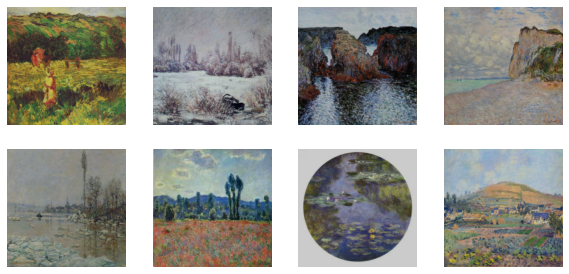

In [ ]:
monet_example = next(iter(monet_dataset))

def display_images(example):
  plt.figure(figsize = (10, 10))

  for n in range(8):
    ax = plt.subplot(4, 4, n + 1)
    plt.imshow(example[n] * 0.5 + 0.5)
    plt.axis("off")

display_images(monet_example)

# Deep Convolutional GAN

### Discriminator
The discriminator receives the 320x320x3 image as input from the generator, and run it through the model.<Br>
The final layer is a fully connected layer that uses a sigmoid activation function and outputs the probability that an image is real rather than fake.

#### Define discriminator

In [ ]:
def build_discriminator():
  model = Sequential()
  model.add(Conv2D(32, (3, 3), strides=(1, 1), padding='same', input_shape=[320, 320, 3]))
  model.add(LeakyReLU(0.2))
  model.add(Dropout(0.3))
  
  model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU(0.2))
  model.add(Dropout(0.3))

  model.add(Conv2D(128, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU(0.2))
  model.add(Dropout(0.3))
  
  model.add(Conv2D(256, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU(0.2))
  model.add(Dropout(0.3))
  
  model.add(Conv2D(512, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(LeakyReLU(0.2))
  model.add(Dropout(0.3))

  model.add(Flatten())
  model.add(Dense(1))
  model.add(Activation('sigmoid'))

  return model

#### Custom train function
Create a custom training loop that trains the models and compute the losses.<Br>
The reason we do it is because the regular fit() function is not flexible enough since we use separated loss functions and optimizers for the generator and discriminator

In [ ]:
def train_step(images):
  # Create random noise vect
  noise = tf.random.normal([BATCH_SIZE, noise_dim]) # creates BATCH_SIZE noise vectors, each will be generated by the generator

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    # Use random noise vector to generate images
    generated_images = generator(noise, training=True)

    # Discriminator evaluates the real and fake images
    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    # Losses are computed for both the generator and discriminator
    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)

  # Compute gradients
  gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
  gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

  # Update optimizers
  generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  
  return gen_loss, disc_loss

#### Generate and plot samples
function to plot the generated images from the GAN model

In [ ]:
def sample_images(generator, image_grid_rows=2, image_grid_columns=2):
  # Sample random noise vector
  noise = tf.random.normal([BATCH_SIZE, noise_dim])

  # Generate images
  gen_imgs = generator.predict(noise)

  # Rescale image pixel values to [0, 1]
  gen_imgs = 0.5 * gen_imgs + 0.5

  # Set grid and plot images
  fig, axs = plt.subplots(image_grid_rows, image_grid_columns, figsize=(7, 7), sharey=True, sharex=True)

  count = 0
  for i in range(image_grid_rows):
    for j in range(image_grid_columns):
      axs[i, j].imshow(gen_imgs[count, :, :, :])
      axs[i, j].axis('off')
      count += 1

#### Custom train function
Create a custom training loop that trains the models and compute the losses.<Br>
The reason we do it is because the regular fit() function is not flexible enough since we use separated loss functions and optimizers for the generator and discriminator

Create a custom function that gets dataset and epochs and train the GAN on the number of epochs

In [ ]:
def train(dataset, epochs):
  results = {"generator_loss": [],
             "discriminator_loss": []
             }
  for epoch in range(epochs):
    # Create empty lists to store losses 
    gen_loss_list = []
    disc_loss_list = []

    for image_batch in dataset:
      t = train_step(image_batch)
      gen_loss_list.append(t[0])
      disc_loss_list.append(t[1])
      
      # Calculate total loss 
      g_loss = sum(gen_loss_list) / len(gen_loss_list)
      d_loss = sum(disc_loss_list) / len(disc_loss_list)

    print(f'Epoch {epoch + 1} [Generator loss: {g_loss:.3f}] [Discriminator loss: {d_loss:.3f}]')
    
    results["generator_loss"].append(g_loss)
    results["discriminator_loss"].append(d_loss)

    # output an image during the train
    if (epoch + 1) % sample_interval == 0:
      sample_images(generator)
  
  return results

## Experiment 1

### Generator
The generator takes in a random noise vector as input and reshapes it into a 10x10x1024 tensor through a fully connected layer.

#### Define generator

In [ ]:
def build_generator():
  model = Sequential()
  model.add(Dense(10*10*1024, input_shape=(100,)))
  model.add(Reshape((10, 10, 1024)))

  model.add(Conv2DTranspose(512, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(ReLU())

  model.add(Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(ReLU())
  
  model.add(Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(ReLU())
  
  model.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(ReLU())
  
  model.add(Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same'))
  model.add(BatchNormalization())
  model.add(ReLU())

  model.add(Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same'))
  model.add(Activation('sigmoid'))

  return model

#### Create generator

In [ ]:
generator = build_generator()

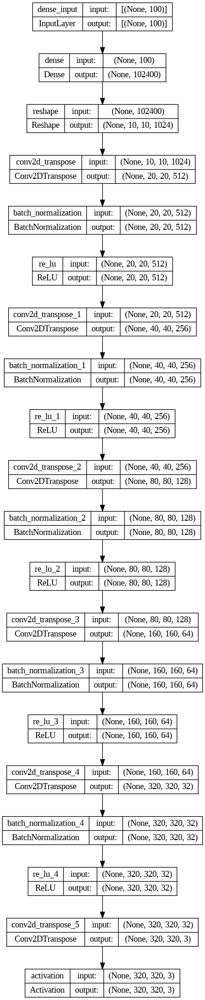

In [ ]:
plot_model(generator, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

#### Display an example of generated image

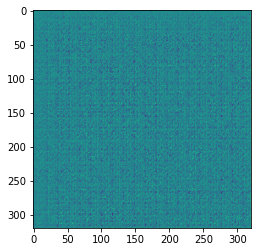

In [ ]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

#### Create discriminator

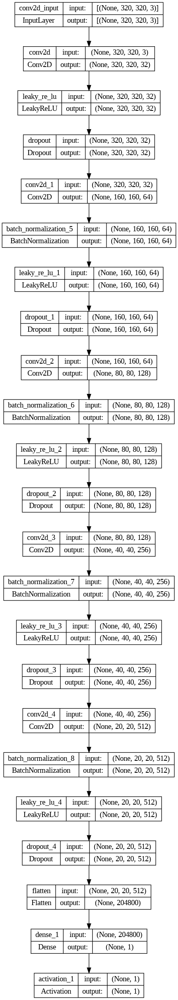

In [ ]:
discriminator = build_discriminator()
plot_model(discriminator, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

##### Display an example of discriminator decision
classify the image we have generated above and decide whether its real or not (1 real, 0 fake)

In [ ]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[0.49939787]], shape=(1, 1), dtype=float32)


### Optimizers
Create two separated optimizers for the generator and discriminator

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.00015, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001, beta_1=0.5)

### Loss functions
Create two separated loss functions for the generator and discriminator

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)  # tf.ones_like creates a tensor of all ones that has the same shape as the input
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)  # tf.zeros_like creates a tensor of all zeros that has the same shape as the input
  total_loss = real_loss + fake_loss

  return total_loss

### Train model

#### Set parameters

In [ ]:
EPOCHS = 50
noise_dim = 100
sample_interval = EPOCHS / 10
num_examples_to_generate = 16

#### Start train

/usr/local/lib/python3.9/dist-packages/keras/backend.py:5676: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


Epoch 1 [Generator loss: 1.264] [Discriminator loss: 1.503]
Epoch 2 [Generator loss: 1.644] [Discriminator loss: 1.202]
Epoch 3 [Generator loss: 1.788] [Discriminator loss: 1.246]
Epoch 4 [Generator loss: 1.975] [Discriminator loss: 0.939]
Epoch 5 [Generator loss: 2.233] [Discriminator loss: 0.657]
1/1 [==============================] - 0s 222ms/step
Epoch 6 [Generator loss: 2.675] [Discriminator loss: 0.522]
Epoch 7 [Generator loss: 3.169] [Discriminator loss: 0.244]
Epoch 8 [Generator loss: 3.800] [Discriminator loss: 0.154]
Epoch 9 [Generator loss: 4.077] [Discriminator loss: 0.083]
Epoch 10 [Generator loss: 3.998] [Discriminator loss: 0.093]
1/1 [==============================] - 0s 19ms/step
Epoch 11 [Generator loss: 4.638] [Discriminator loss: 0.076]
Epoch 12 [Generator loss: 5.003] [Discriminator loss: 0.055]
Epoch 13 [Generator loss: 5.001] [Discriminator loss: 0.048]
Epoch 14 [Generator loss: 5.454] [Discriminator loss: 0.023]
Epoch 15 [Generator loss: 5.721] [Discriminator lo

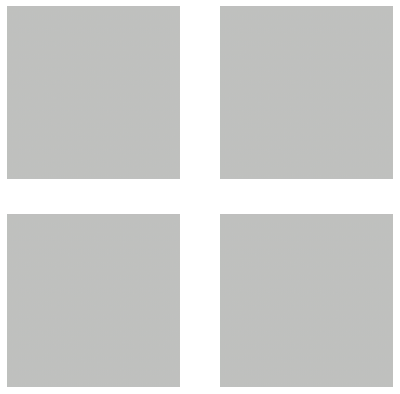

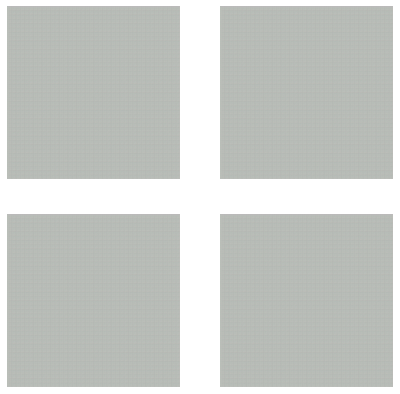

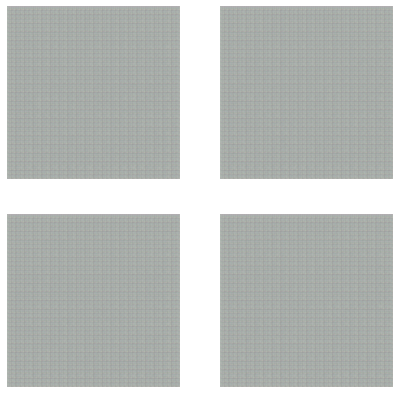

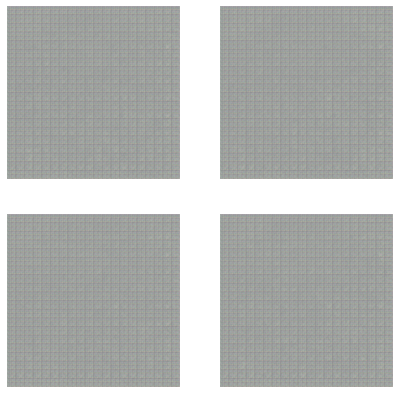

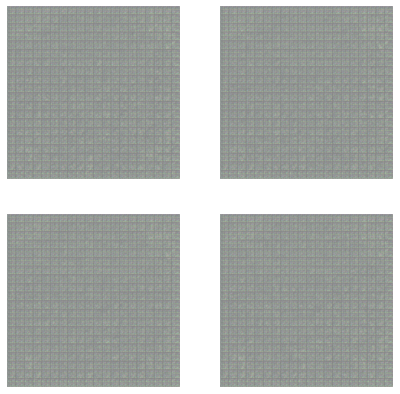

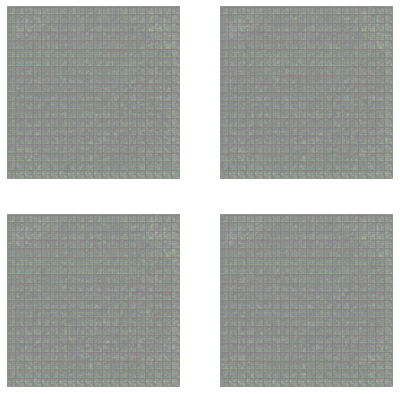

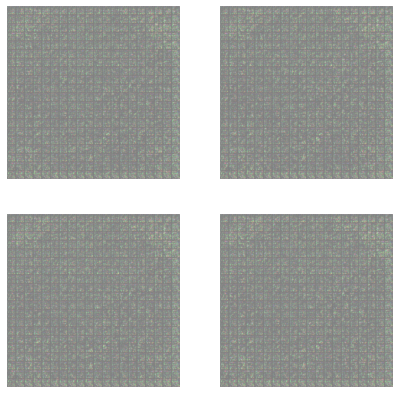

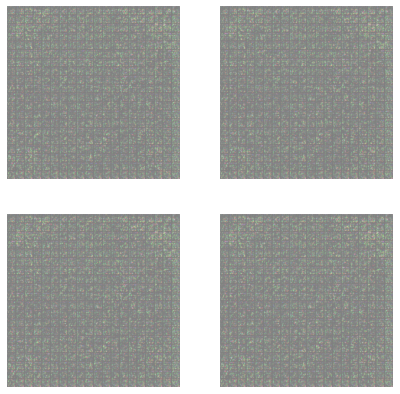

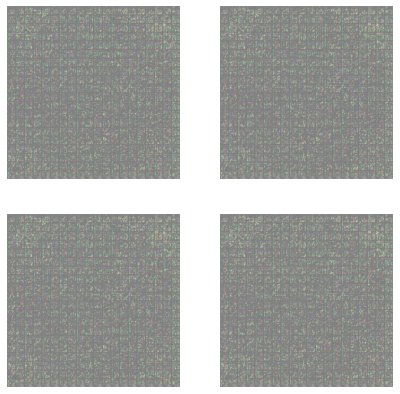

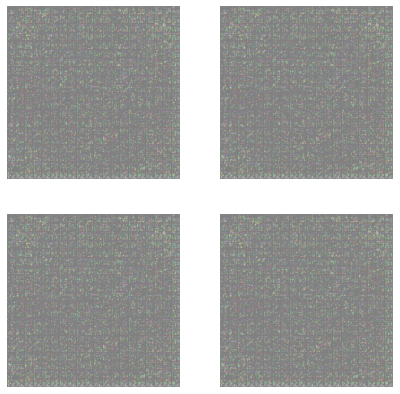

In [ ]:
exp1_history = train(monet_dataset, EPOCHS)

### Display results

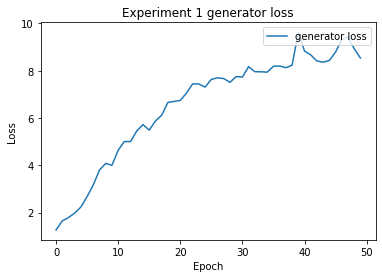

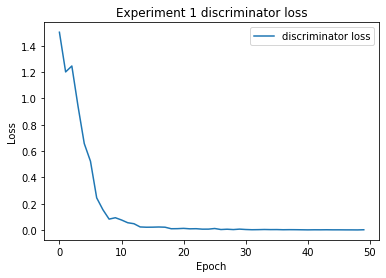

In [ ]:
plot_loss(exp1_history, "Experiment 1")

## Experiment 2

### Generator
The generator takes in a random noise vector as input and reshapes it into a 10x10x1024 tensor through a fully connected layer.<Br>
We have changed the activation function in the output layer to use "tanh" instead of "sigmoid"

#### Define generator

In [ ]:
def build_generator():
  model = Sequential()
  model.add(Dense(10*10*1024, input_shape=(100,)))
  model.add(Reshape((10, 10, 1024)))

  model.add(Conv2DTranspose(512, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  
  model.add(Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  
  model.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  
  model.add(Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))

  model.add(Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same'))
  model.add(Activation('tanh'))

  return model

#### Create generator

In [ ]:
generator = build_generator()

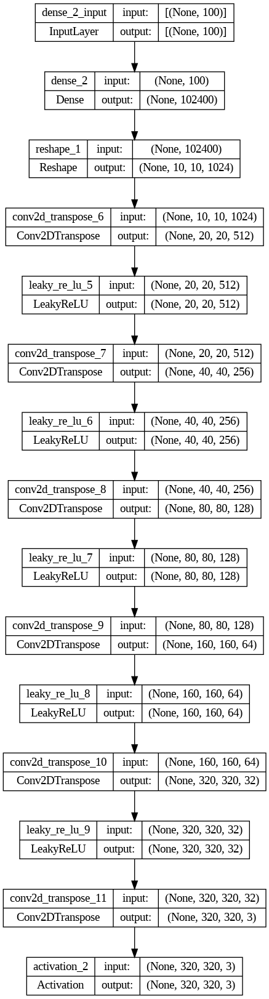

In [ ]:
plot_model(generator, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

#### Display an example of generated image

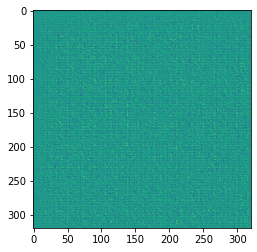

In [ ]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

### Discriminator
The discriminator receives the 320x320x3 image as input from the generator, and run it through the model.<Br>
The final layer is a fully connected layer that uses a sigmoid activation function and outputs the probability that an image is real rather than fake.

#### Create discriminator

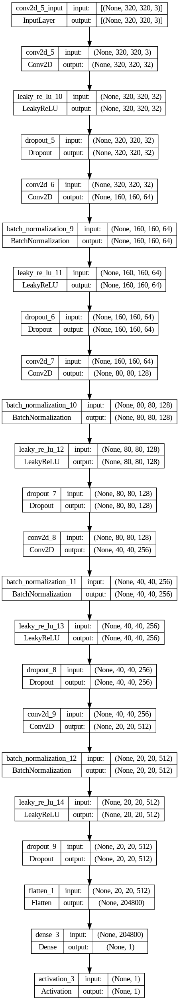

In [ ]:
discriminator = build_discriminator()
plot_model(discriminator, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

##### Display an example of discriminator decision
classify the image we have generated above and decide whether its real or not (1 real, 0 fake)

In [ ]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[0.4999979]], shape=(1, 1), dtype=float32)


### Optimizers
Create two separated optimizers for the generator and discriminator<Br>
In this experiment we have changed the values of the learning rates.

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

### Loss functions
Create two separated loss functions for the generator and discriminator

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)  # tf.ones_like creates a tensor of all ones that has the same shape as the input
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)  # tf.zeros_like creates a tensor of all zeros that has the same shape as the input
  total_loss = real_loss + fake_loss

  return total_loss

### Train model

#### Set parameters

In [ ]:
EPOCHS = 50
noise_dim = 100
sample_interval = EPOCHS / 10
num_examples_to_generate = 16

#### Start train

Epoch 1 [Generator loss: 1.648] [Discriminator loss: 2.344]
Epoch 2 [Generator loss: 1.368] [Discriminator loss: 1.636]
Epoch 3 [Generator loss: 2.023] [Discriminator loss: 2.370]
Epoch 4 [Generator loss: 2.467] [Discriminator loss: 1.885]
Epoch 5 [Generator loss: 2.610] [Discriminator loss: 2.381]
1/1 [==============================] - 0s 153ms/step
Epoch 6 [Generator loss: 2.972] [Discriminator loss: 1.898]
Epoch 7 [Generator loss: 2.466] [Discriminator loss: 2.286]
Epoch 8 [Generator loss: 2.154] [Discriminator loss: 1.643]
Epoch 9 [Generator loss: 2.119] [Discriminator loss: 1.790]
Epoch 10 [Generator loss: 2.390] [Discriminator loss: 1.273]
1/1 [==============================] - 0s 20ms/step
Epoch 11 [Generator loss: 2.287] [Discriminator loss: 1.354]
Epoch 12 [Generator loss: 2.393] [Discriminator loss: 1.175]
Epoch 13 [Generator loss: 2.519] [Discriminator loss: 1.165]
Epoch 14 [Generator loss: 2.530] [Discriminator loss: 1.345]
Epoch 15 [Generator loss: 2.415] [Discriminator lo

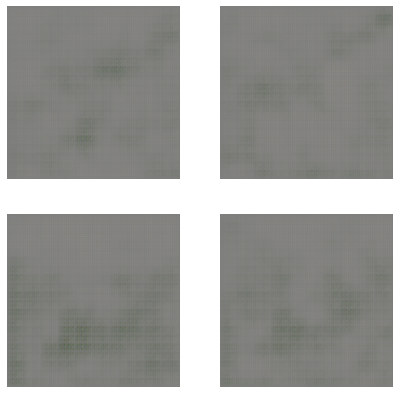

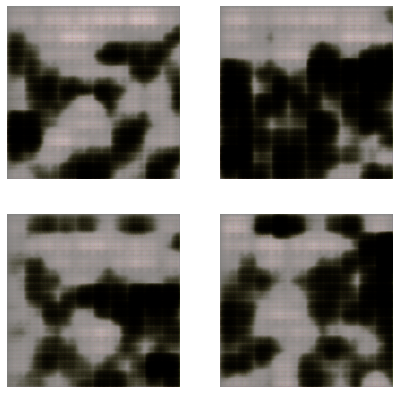

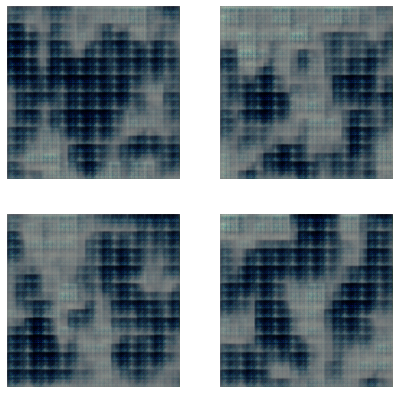

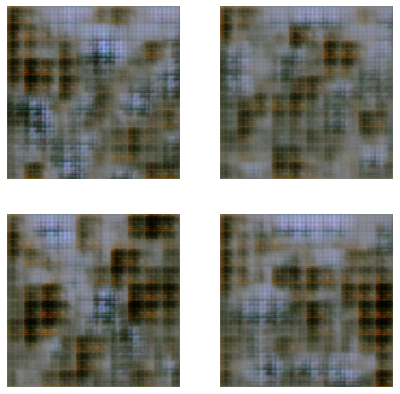

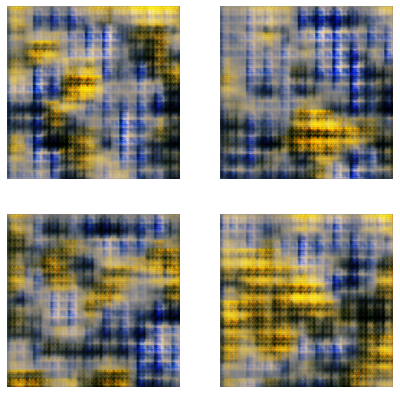

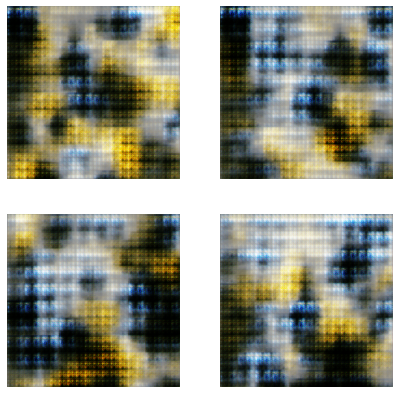

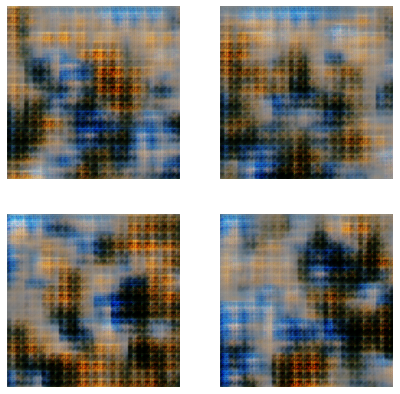

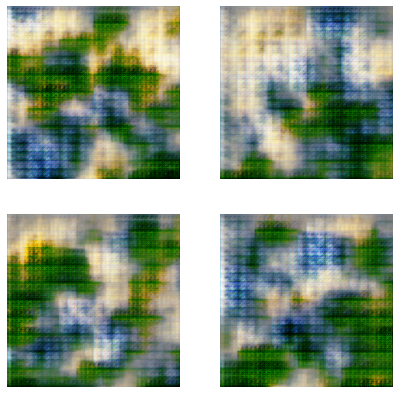

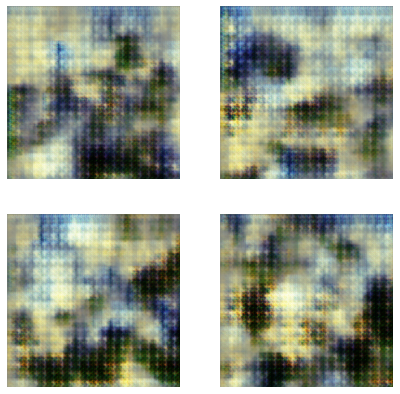

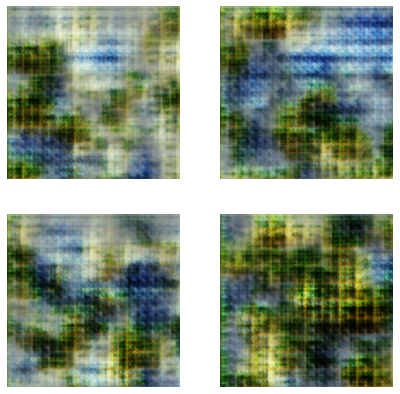

In [ ]:
exp2_history = train(monet_dataset, EPOCHS)

### Display results

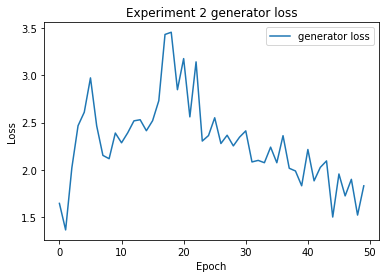

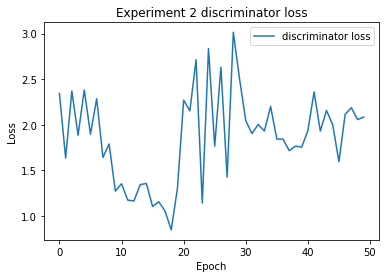

In [ ]:
plot_loss(exp2_history, "Experiment 2")

## Experiment 3

### Generator
The generator takes in a random noise vector as input and reshapes it into a 10x10x1024 tensor through a fully connected layer.

#### Define generator

In [ ]:
def build_generator():
  model = Sequential()
  model.add(Dense(10*10*1024, input_shape=(100,)))
  model.add(Reshape((10, 10, 1024)))

  model.add(Conv2DTranspose(512, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.4))

  model.add(Conv2DTranspose(256, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.4))
  
  model.add(Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.4))
  
  model.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.4))
  
  model.add(Conv2DTranspose(32, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.4))

  model.add(Conv2DTranspose(3, (3, 3), strides=(1, 1), padding='same'))
  model.add(Activation('tanh'))

  return model

#### Create generator

In [ ]:
generator = build_generator()

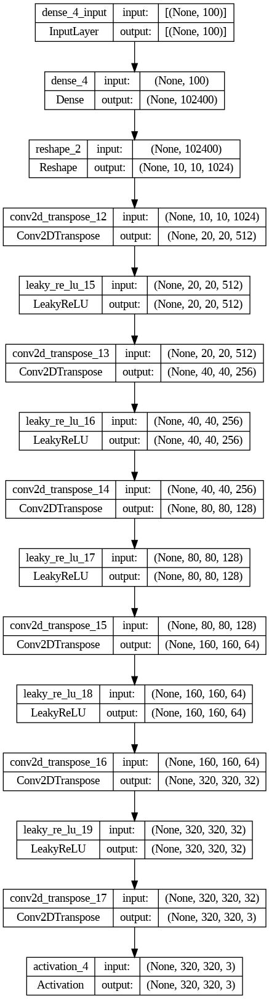

In [ ]:
plot_model(generator, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

#### Display an example of generated image

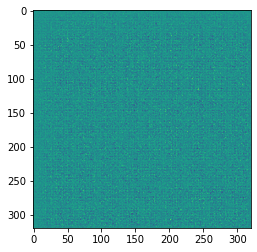

In [ ]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

plt.imshow(generated_image[0, :, :, 0])

### Discriminator
The discriminator receives the 320x320x3 image as input from the generator, and run it through the model.<Br>
The final layer is a fully connected layer that uses a sigmoid activation function and outputs the probability that an image is real rather than fake.

#### Create discriminator

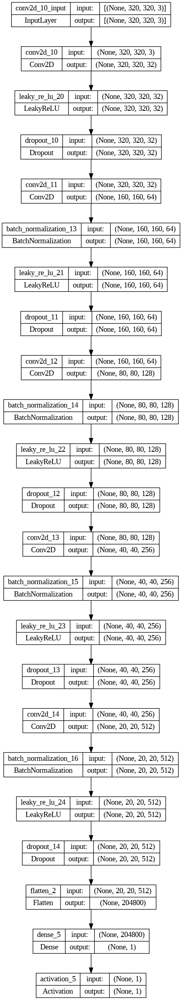

In [ ]:
discriminator = build_discriminator()
plot_model(discriminator, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

##### Display an example of discriminator decision
classify the image we have generated above and decide whether its real or not (1 real, 0 fake)

In [ ]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[0.49997818]], shape=(1, 1), dtype=float32)


### Optimizers
Create two separated optimizers for the generator and discriminator<Br>
We have changed again the learning rates in this experiment.

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0008, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003, beta_1=0.5)

### Loss functions
Create two separated loss functions for the generator and discriminator

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(fake_output):
  return cross_entropy(tf.ones_like(fake_output), fake_output)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)  # tf.ones_like creates a tensor of all ones that has the same shape as the input
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)  # tf.zeros_like creates a tensor of all zeros that has the same shape as the input
  total_loss = real_loss + fake_loss

  return total_loss

### Train model

#### Set parameters
In this experiment we have increased the number of epochs to 100

In [ ]:
EPOCHS = 100
noise_dim = 100
sample_interval = EPOCHS / 10
num_examples_to_generate = 16

#### Start train

Epoch 1 [Generator loss: 2.282] [Discriminator loss: 3.597]
Epoch 2 [Generator loss: 2.388] [Discriminator loss: 3.526]
Epoch 3 [Generator loss: 2.702] [Discriminator loss: 3.859]
Epoch 4 [Generator loss: 2.405] [Discriminator loss: 3.620]
Epoch 5 [Generator loss: 2.697] [Discriminator loss: 2.973]
Epoch 6 [Generator loss: 2.503] [Discriminator loss: 2.996]
Epoch 7 [Generator loss: 2.924] [Discriminator loss: 1.995]
Epoch 8 [Generator loss: 2.796] [Discriminator loss: 2.869]
Epoch 9 [Generator loss: 3.040] [Discriminator loss: 2.911]
Epoch 10 [Generator loss: 2.587] [Discriminator loss: 2.090]
1/1 [==============================] - 0s 214ms/step
Epoch 11 [Generator loss: 3.186] [Discriminator loss: 2.281]
Epoch 12 [Generator loss: 3.722] [Discriminator loss: 2.674]
Epoch 13 [Generator loss: 3.476] [Discriminator loss: 2.641]
Epoch 14 [Generator loss: 3.112] [Discriminator loss: 1.262]
Epoch 15 [Generator loss: 3.402] [Discriminator loss: 2.391]
Epoch 16 [Generator loss: 3.091] [Discrim

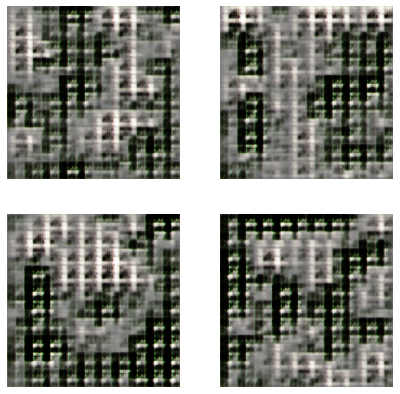

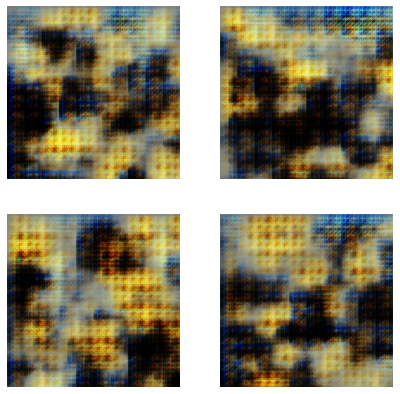

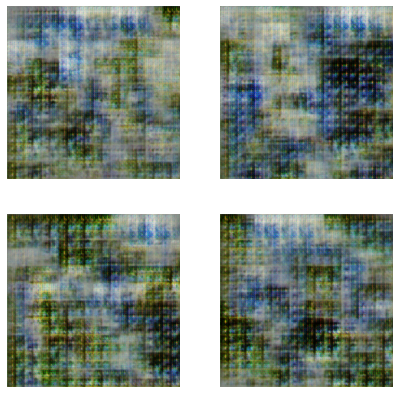

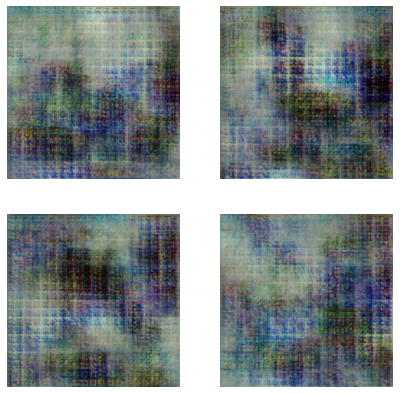

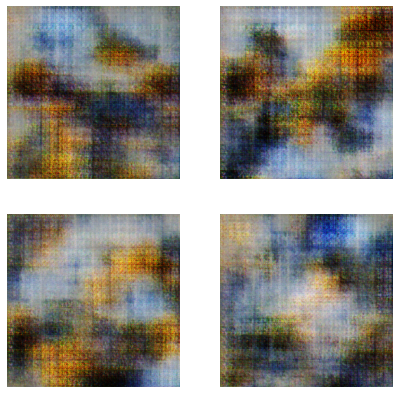

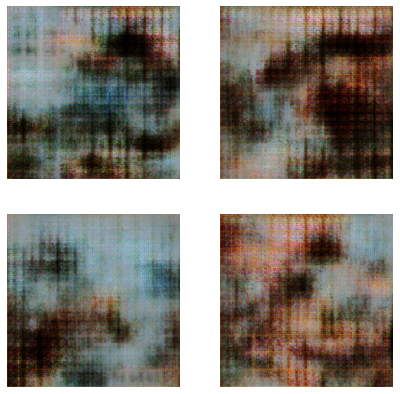

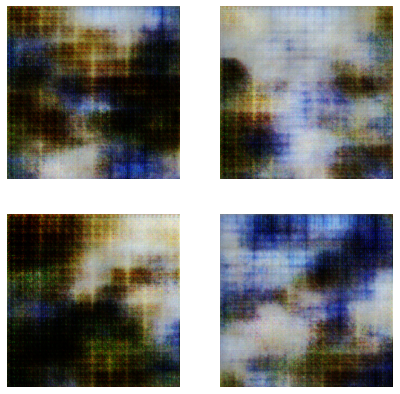

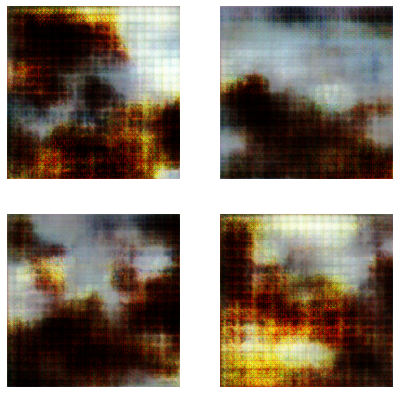

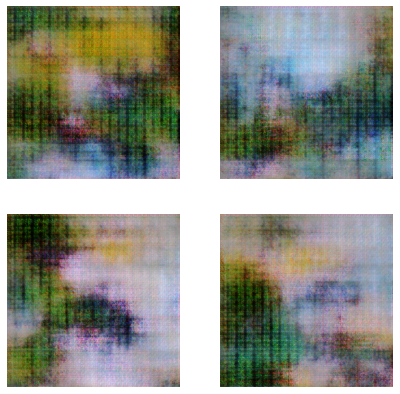

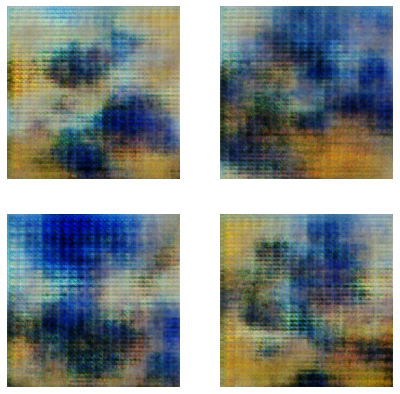

In [ ]:
exp3_history = train(monet_dataset, EPOCHS)

### Display results

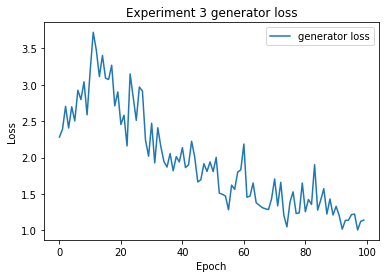

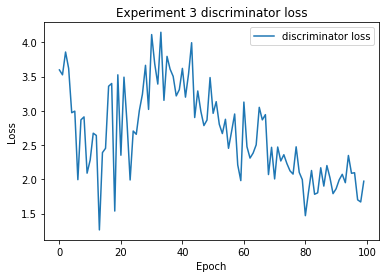

In [ ]:
plot_loss(exp3_history, "Experiment 3")

In [ ]:
#%%script echo skipping
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#%%script echo skipping
generator.save('/content/DCGAN_Model.h5')